https://www.freecodecamp.org/learn/machine-learning-with-python/machine-learning-with-python-projects/cat-and-dog-image-classifier

# Cat and Dog Image Classifier

You will be working on this project with Google Colaboratory.

After going to that link, create a copy of the notebook either in your own account or locally. Once you complete the project and it passes the test (included at that link), submit your project link below. If you are submitting a Google Colaboratory link, make sure to turn on link sharing for "anyone with the link."

We are still developing the interactive instructional content for the machine learning curriculum. For now, you can go through the video challenges in this certification. You may also have to seek out additional learning resources, similar to what you would do when working on a real-world project.

For this challenge, you will complete the code to classify images of dogs and cats. You will use TensorFlow 2.0 and Keras to create a convolutional neural network that correctly classifies images of cats and dogs at least 63% of the time. (Extra credit if you get it to 70% accuracy!)

Some of the code is given to you but some code you must fill in to complete this challenge. Read the instruction in each text cell so you will know what you have to do in each code cell.

The first code cell imports the required libraries. The second code cell downloads the data and sets key variables. The third cell is the first place you will write your own code.

The structure of the dataset files that are downloaded looks like this (You will notice that the test directory has no subdirectories and the images are not labeled):

cats_and_dogs
|__ train:
    |______ cats: [cat.0.jpg, cat.1.jpg ...]
    |______ dogs: [dog.0.jpg, dog.1.jpg ...]
|__ validation:
    |______ cats: [cat.2000.jpg, cat.2001.jpg ...]
    |______ dogs: [dog.2000.jpg, dog.2001.jpg ...]
|__ test: [1.jpg, 2.jpg ...]
You can tweak epochs and batch size if you like, but it is not required.

The following instructions correspond to specific cell numbers, indicated with a comment at the top of the cell (such as # 3).

In [20]:
try:
  # This command only in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import datetime
import os
import numpy as np
import matplotlib.pyplot as plt

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [21]:
#%pip install git+https://github.com/tensorflow/docs

import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
import tensorflow_docs.plots

In [22]:
# Get project files
'''!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip cats_and_dogs.zip'''

PATH = 'cats_and_dogs'

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
test_dir = os.path.join(PATH, 'test')

log_dir = os.path.join(PATH, 'logs')
def tensorboard_callback(name):
    return tf.keras.callbacks.TensorBoard(log_dir=log_dir + '/' + name, histogram_freq=1)

# Get number of files in each directory. The train and validation directories
# each have the subdirecories "dogs" and "cats".
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_test = len(os.listdir(test_dir))

# Variables for pre-processing and training.
batch_size = 128
epochs = 200
IMG_HEIGHT = 150
IMG_WIDTH = 150

Cell 3
Now it is your turn! Set each of the variables in this cell correctly. (They should no longer equal None.)

Create image generators for each of the three image data sets (train, validation, test). Use ImageDataGenerator to read / decode the images and convert them into floating point tensors. Use the rescale argument (and no other arguments for now) to rescale the tensors from values between 0 and 255 to values between 0 and 1.

For the *_data_gen variables, use the flow_from_directory method. Pass in the batch size, directory, target size ((IMG_HEIGHT, IMG_WIDTH)), class mode, and anything else required. test_data_gen will be the trickiest one. For test_data_gen, make sure to pass in shuffle=False to the flow_from_directory method. This will make sure the final predictions stay in the order that our test expects. For test_data_gen it will also be helpful to observe the directory structure.

After you run the code, the output should look like this:

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 50 images belonging to 1 class.

In [23]:
# 3
train_image_generator = ImageDataGenerator(
    rescale = 1./255,
)
validation_image_generator = ImageDataGenerator(
    rescale = 1./255,
)
test_image_generator = ImageDataGenerator(
    rescale = 1./255,
)

train_data_gen = train_image_generator.flow_from_directory(
    directory=train_dir,
    batch_size=batch_size,
    shuffle=True,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    keep_aspect_ratio=True,
    class_mode='binary'
)
val_data_gen = validation_image_generator.flow_from_directory(
    directory=validation_dir,
    batch_size=batch_size,
    shuffle=True,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    keep_aspect_ratio=True,
    class_mode='binary'
)
test_data_gen = test_image_generator.flow_from_directory(
    directory=PATH,
    batch_size=batch_size,
    shuffle=False,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    keep_aspect_ratio=True,
    classes=['test']
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 50 images belonging to 1 classes.


In [24]:
train_augm_image_generator = ImageDataGenerator(
    rotation_range=60,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.5,1.5],
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale = 1./255,
)
train_augm_data_gen = train_augm_image_generator.flow_from_directory(
    batch_size=batch_size,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    keep_aspect_ratio=True,
    class_mode='binary'
)

Found 2000 images belonging to 2 classes.


In [ ]:
def init_model(model_type):
  match model_type:
    case 'tiny1':
      model = Sequential([ #74%, no overfitting, 11M
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'tiny2':
      model = Sequential([ #50% (bug??), no overfitting, 11M
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'tiny3':
      model = Sequential([ #72% , no overfitting, 89M
        Conv2D(128, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dense(128, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'tiny4':
      model = Sequential([ #50% (bug??), no overfitting, 89M
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'small1':
      model = Sequential([ #76%, no overfitting, 11M
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dense(128, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'small2':
      model = Sequential([ #76%, no overfitting, 11M
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'small3':
      model = Sequential([ #77%, no overfitting, 85M
        Conv2D(128, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'small4':
      model = Sequential([ # 
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'medium1':
      model = Sequential([ #80%, slight overfitting, 10M
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'medium2':
      model = Sequential([ #82%, no overfitting, 10M
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'medium3':
      model = Sequential([ #82%, slight overfitting, 38M
        Conv2D(64, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'medium4':
      model = Sequential([ #
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
      ])
    case 'large1':
      model = Sequential([ #85%, slight overfitting, 8M
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'large2':
      model = Sequential([ #50% (bug??), no overfitting, 8M
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'large2.2': #removed one dense layer, reduced dropout and l2
      model = Sequential([ #
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'large3':
      model = Sequential([ #86%, slight overfitting, 28M
        Conv2D(64, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(1024, activation='relu'),
        Dense(1024, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'large4':
      model = Sequential([ #86%, no overfitting, 28M
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'large4.2': #reduced dropout and l2
      model = Sequential([ #
        Conv2D(64, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'extra1':
      model = Sequential([ #82%, light overfitting, still slowly increasing acc, 9M
        Conv2D(32, (2, 2), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(512, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'extra2':
      model = Sequential([ #83%, no overfitting, 9M
        Conv2D(32, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'extra2.2': #reduced dropout and l2, first dense increased
      model = Sequential([ #
        Conv2D(32, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'extra3':
      model = Sequential([ #84%, slight overfitting, 35M
        Conv2D(64, (2, 2), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (2, 2), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(1024, activation='relu'),
        Dense(1024, activation='relu'),
        Dense(1, activation='sigmoid')
      ])
    case 'extra3.2': #added dropout, bath normalization
      model = Sequential([ #
        Conv2D(64, (2, 2), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (2, 2), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.3),
        Dense(1024, activation='relu'),
        Dropout(0.3),
        Dense(1024, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
      ])
    case 'extra4':
      model = Sequential([ #84%, no overfitting, 35M
        Conv2D(64, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.5),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.5),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'extra4.2': #reduced dropout and l2, added one dense layer
      model = Sequential([ #
        Conv2D(64, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(512, (2, 2), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        Dropout(0.3),
        Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])
    case 'extra5':
      model = Sequential([ #ChatGPT generated #87%, light overfitting, still slowly increasing acc, 7M
        # First Convolutional Block
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Second Convolutional Block
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Third Convolutional Block
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Fourth Convolutional Block (optional but can improve accuracy)
        Conv2D(256, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Flatten the output to feed into dense layers
        Flatten(),
        # Fully Connected Layer
        Dense(512, activation='relu'),
        Dropout(0.5),  # Dropout to reduce overfitting
        # Output Layer
        Dense(1, activation='sigmoid')  # Binary classification: cat or dog
      ])
    case 'extra5.2': #added two dense layer, reduced dropout
      model = Sequential([ #
        # First Convolutional Block
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Second Convolutional Block
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Third Convolutional Block
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Fourth Convolutional Block (optional but can improve accuracy)
        Conv2D(256, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        # Flatten the output to feed into dense layers
        Flatten(),
        # Fully Connected Layer
        Dense(512, activation='relu'),
        Dropout(0.3),  # Dropout to reduce overfitting
        Dense(512, activation='relu'),
        Dropout(0.3),  # Dropout to reduce overfitting
        Dense(512, activation='relu'),
        Dropout(0.3),  # Dropout to reduce overfitting
        # Output Layer
        Dense(1, activation='sigmoid')  # Binary classification: cat or dog
      ])
  return model

In [26]:
def compile_and_fit(train_ds, model_type, name, max_epochs=10000):
  model = init_model(model_type)
  model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

  model.summary()

  history = model.fit(
    train_ds, #.map(lambda x, y: (x, tf.expand_dims(y, axis=-1))),
    #steps_per_epoch = STEPS_PER_EPOCH,
    epochs = epochs,
    validation_data = val_data_gen,
    callbacks=[
      tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=30),
      tensorboard_callback(name)],
    #verbose=0
  )
  return history

size_histories = {}

In [ ]:
histories_0 = {}

#histories_0['Tiny_1'] = compile_and_fit(train_augm_data_gen, 'tiny1', 'sizes/Tiny_1') #74%, no overfitting, 11M
#histories_0['Tiny_2'] = compile_and_fit(train_augm_data_gen, 'tiny2', 'sizes/Tiny_2') #50% (bug??), no overfitting, 11M
#histories_0['Tiny_3'] = compile_and_fit(train_augm_data_gen, 'tiny3', 'sizes/Tiny_3') #72% , no overfitting, 89M
#histories_0['Tiny_4'] = compile_and_fit(train_augm_data_gen, 'tiny4', 'sizes/Tiny_4') #50% (bug??), no overfitting, 89M

#histories_0['Small_1'] = compile_and_fit(train_augm_data_gen, 'small1', 'sizes/Small_1') #76%, no overfitting, 11M
#histories_0['Small_2'] = compile_and_fit(train_augm_data_gen, 'small2', 'sizes/Small_2') #76%, no overfitting, 11M
#histories_0['Small_3'] = compile_and_fit(train_augm_data_gen, 'small3', 'sizes/Small_3') #77%, no overfitting, 85M
#histories_0['Small_4'] = compile_and_fit(train_augm_data_gen, 'small4', 'sizes/Small_4') #??? dead

#histories_0['Medium_1'] = compile_and_fit(train_augm_data_gen, 'medium1', 'sizes/Medium_1') #80%, slight overfitting, 10M
#histories_0['Medium_2'] = compile_and_fit(train_augm_data_gen, 'medium2', 'sizes/Medium_2') #82%, no overfitting, 10M
#histories_0['Medium_3'] = compile_and_fit(train_augm_data_gen, 'medium3', 'sizes/Medium_3') #82%, slight overfitting, 38M
#histories_0['Medium_4'] = compile_and_fit(train_augm_data_gen, 'medium4', 'sizes/Medium_4')

#histories_0['Large_1'] = compile_and_fit(train_augm_data_gen, 'large1', 'sizes/Large_1') #85%, slight overfitting, 8M
#histories_0['Large_2'] = compile_and_fit(train_augm_data_gen, 'large2', 'sizes/Large_2') #50% (bug??), no overfitting, 8M
#histories_0['Large_3'] = compile_and_fit(train_augm_data_gen, 'large3', 'sizes/Large_3') #86%, slight overfitting, 28M
#histories_0['Large_4'] = compile_and_fit(train_augm_data_gen, 'large4', 'sizes/Large_4') #86%, no overfitting, 28M

#histories_0['Extra_1'] = compile_and_fit(train_augm_data_gen, 'extra1', 'sizes/Extra_1') #82%, light overfitting, still slowly increasing acc, 9M
#histories_0['Extra_2'] = compile_and_fit(train_augm_data_gen, 'extra2', 'sizes/Extra_2') #83%, no overfitting, 9M
#histories_0['Extra_3'] = compile_and_fit(train_augm_data_gen, 'extra3', 'sizes/Extra_3') #84%, slight overfitting, 35M
#histories_0['Extra_4'] = compile_and_fit(train_augm_data_gen, 'extra4', 'sizes/Extra_4') #84%, no overfitting, 35M
#histories_0['Extra_5'] = compile_and_fit(train_augm_data_gen, 'extra5', 'sizes/Extra_5') #ChatGPT generated #87%, slight overfitting, still slowly increasing acc, 7M

histories_0['Large_2.2'] = compile_and_fit(train_augm_data_gen, 'large2.2', 'sizes/Large_2.2') #
histories_0['Large_4.2'] = compile_and_fit(train_augm_data_gen, 'large4.2', 'sizes/Large_4.2') #
histories_0['Extra_2.2'] = compile_and_fit(train_augm_data_gen, 'extra2.2', 'sizes/Extra_2.2') #
histories_0['Extra_3.2'] = compile_and_fit(train_augm_data_gen, 'extra3.2', 'sizes/Extra_3.2') #
histories_0['Extra_4.2'] = compile_and_fit(train_augm_data_gen, 'extra4.2', 'sizes/Extra_4.2') #
histories_0['Extra_5.2'] = compile_and_fit(train_augm_data_gen, 'extra5.2', 'sizes/Extra_5.2') #

/home/andreati/Coding/Learning/TensorFlow/.venvTF/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
W0000 00:00:1740409635.311117  233068 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │    25,691,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,292,737 (107.93 MB)

 Trainable params: 28,292,737 (107.93 MB)

 Non-trainable params: 0 (0.00 B)

/home/andreati/Coding/Learning/TensorFlow/.venvTF/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4943 - loss: 0.8275

/home/andreati/Coding/Learning/TensorFlow/.venvTF/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
2025-02-24 12:08:35.392781: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 6165626880 exceeds 10% of free system memory.


16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.4941 - loss: 0.8230 - val_accuracy: 0.5010 - val_loss: 0.6930
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4954 - loss: 0.6934

2025-02-24 12:09:55.869933: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 6165626880 exceeds 10% of free system memory.


16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.4954 - loss: 0.6934 - val_accuracy: 0.4990 - val_loss: 0.6929
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5373 - loss: 0.6927

2025-02-24 12:11:17.904631: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 6165626880 exceeds 10% of free system memory.


16/16 ━━━━━━━━━━━━━━━━━━━━ 82s 5s/step - accuracy: 0.5374 - loss: 0.6927 - val_accuracy: 0.5000 - val_loss: 0.6933
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5071 - loss: 0.6955

2025-02-24 12:12:40.012046: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 6165626880 exceeds 10% of free system memory.


16/16 ━━━━━━━━━━━━━━━━━━━━ 82s 5s/step - accuracy: 0.5069 - loss: 0.6954 - val_accuracy: 0.5000 - val_loss: 0.6916
Epoch 5/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4946 - loss: 0.6931

2025-02-24 12:14:00.200948: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 6165626880 exceeds 10% of free system memory.


16/16 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 0.4952 - loss: 0.6930 - val_accuracy: 0.5200 - val_loss: 0.6864
Epoch 6/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5563 - loss: 0.6869 - val_accuracy: 0.5000 - val_loss: 0.6891
Epoch 7/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5285 - loss: 0.6880 - val_accuracy: 0.6170 - val_loss: 0.6768
Epoch 8/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5883 - loss: 0.6766 - val_accuracy: 0.6240 - val_loss: 0.6612
Epoch 9/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5043 - loss: 0.6931 - val_accuracy: 0.5480 - val_loss: 0.6881
Epoch 10/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5524 - loss: 0.6849 - val_accuracy: 0.6120 - val_loss: 0.6612
Epoch 11/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5902 - loss: 0.6696 - val_accuracy: 0.6230 - val_loss: 0.6331
Epoch 12/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.5979 - loss: 0.6540 - val_accuracy: 0.6240 - val_loss: 

/home/andreati/Coding/Learning/TensorFlow/.venvTF/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │    25,691,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,292,737 (107.93 MB)

 Trainable params: 28,292,737 (107.93 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 88s 5s/step - accuracy: 0.4865 - loss: 1.0852 - val_accuracy: 0.4990 - val_loss: 0.9438
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.4946 - loss: 0.9278 - val_accuracy: 0.5000 - val_loss: 0.8828
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.4891 - loss: 0.8723 - val_accuracy: 0.5000 - val_loss: 0.8422
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.4976 - loss: 0.8350 - val_accuracy: 0.6380 - val_loss: 0.8149
Epoch 5/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.5141 - loss: 0.8097 - val_accuracy: 0.6010 - val_loss: 0.7860
Epoch 6/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.5246 - loss: 0.7917 - val_accuracy: 0.5330 - val_loss: 0.7686
Epoch 7/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.5501 - loss: 0.7727 - val_accuracy: 0.6030 - val_loss: 0.7410
Epoch 8/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 85s 5s/step - accuracy: 0.5637 - loss: 0.7519 - val_accuracy: 0.5600 - v

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 149, 149, 64)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 73, 73, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 35, 35, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 16, 16, 512)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1024)           │    33,555,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35,295,937 (134.64 MB)

 Trainable params: 35,295,937 (134.64 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 72s 4s/step - accuracy: 0.4885 - loss: 0.7658 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 70s 4s/step - accuracy: 0.5050 - loss: 0.6933 - val_accuracy: 0.5580 - val_loss: 0.6901
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.5401 - loss: 0.6896 - val_accuracy: 0.5990 - val_loss: 0.6751
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.5386 - loss: 0.6886 - val_accuracy: 0.5450 - val_loss: 0.6881
Epoch 5/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.5187 - loss: 0.6856 - val_accuracy: 0.5430 - val_loss: 0.6854
Epoch 6/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.5551 - loss: 0.6774 - val_accuracy: 0.6380 - val_loss: 0.6458
Epoch 7/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.6164 - loss: 0.6472 - val_accuracy: 0.5430 - val_loss: 0.7050
Epoch 8/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 65s 4s/step - accuracy: 0.5956 - loss: 0.6587 - val_accuracy: 0.6340 - v

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 149, 149, 64)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 73, 73, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 35, 35, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 16, 16, 512)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1024)           │    33,555,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35,295,937 (134.64 MB)

 Trainable params: 35,295,937 (134.64 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 68s 4s/step - accuracy: 0.4844 - loss: 1.1209 - val_accuracy: 0.5000 - val_loss: 0.9478
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 63s 4s/step - accuracy: 0.4945 - loss: 0.9320 - val_accuracy: 0.5000 - val_loss: 0.8897
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 64s 4s/step - accuracy: 0.4874 - loss: 0.8787 - val_accuracy: 0.5130 - val_loss: 0.8463
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 63s 4s/step - accuracy: 0.5262 - loss: 0.8398 - val_accuracy: 0.5280 - val_loss: 0.8087
Epoch 5/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 64s 4s/step - accuracy: 0.5151 - loss: 0.8138 - val_accuracy: 0.5570 - val_loss: 0.7971
Epoch 6/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 64s 4s/step - accuracy: 0.5648 - loss: 0.7902 - val_accuracy: 0.5920 - val_loss: 0.7583
Epoch 7/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 64s 4s/step - accuracy: 0.5488 - loss: 0.7724 - val_accuracy: 0.5770 - val_loss: 0.7442
Epoch 8/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 63s 4s/step - accuracy: 0.5631 - loss: 0.7614 - val_accuracy: 0.5670 - v

(0.0, 1.0)

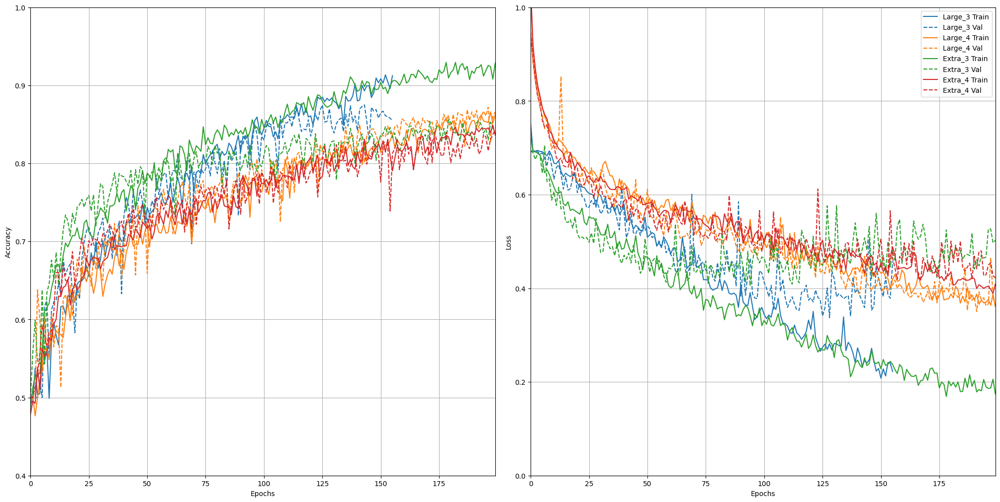

In [28]:
plotter1 = tfdocs.plots.HistoryPlotter(metric = 'accuracy')
plotter2 = tfdocs.plots.HistoryPlotter(metric = 'loss')

fig = plt.figure(figsize=(20, 10), layout="constrained")
spec = fig.add_gridspec(ncols=2, nrows=1)

ax0 = fig.add_subplot(spec[0, 0])
plotter1.plot(histories_0)
ax0.get_legend().remove()
plt.ylim([0.4, 1])

ax1 = fig.add_subplot(spec[0, 1])
plotter2.plot(histories_0)
plt.ylim([0, 1])

#fig.suptitle('Manually added subplots using add_gridspec')
#plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')

In [30]:
%tensorboard --reload_multifile=true --logdir cats_and_dogs

Reusing TensorBoard on port 6006 (pid 233341), started 23:14:54 ago. (Use '!kill 233341' to kill it.)

(0.0, 1.0)

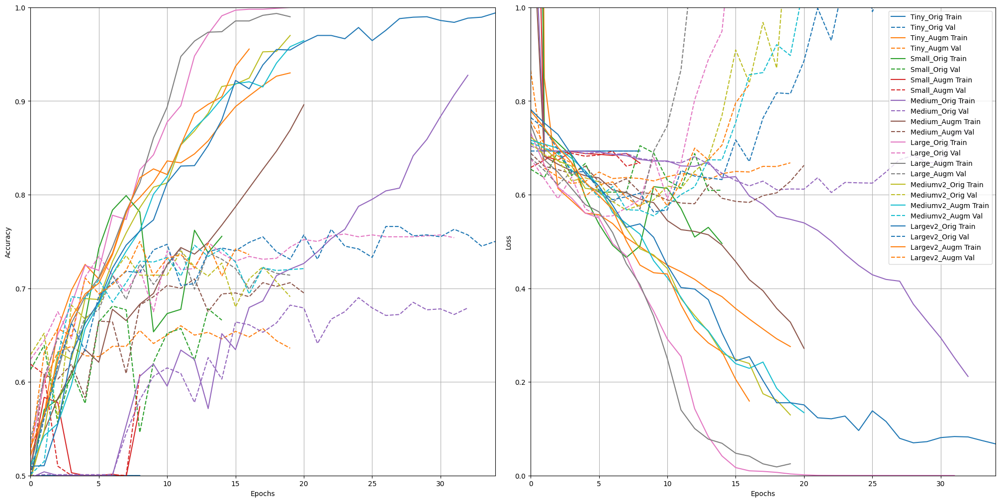

In [305]:
plotter1 = tfdocs.plots.HistoryPlotter(metric = 'accuracy')
plotter2 = tfdocs.plots.HistoryPlotter(metric = 'loss')

fig2 = plt.figure(figsize=(20, 10), layout="constrained")
spec2 = fig2.add_gridspec(ncols=2, nrows=1)

ax2 = fig2.add_subplot(spec2[0, 0])
plotter1.plot(size_histories)
ax2.get_legend().remove()
plt.ylim([0.5, 1])

ax3 = fig2.add_subplot(spec2[0, 1])
plotter2.plot(size_histories)
plt.ylim([0, 1])

In [306]:
size_histories['TinyV3_Augm'] = compile_and_fit(train_augm_data_gen, 'tinyV3', 'sizes/TinyV3_Augm')
size_histories['SmallV3_Augm'] = compile_and_fit(train_augm_data_gen, 'smallV3', 'sizes/SmallV3_Augm')
size_histories['MediumV3_Augm'] = compile_and_fit(train_augm_data_gen, 'mediumV3', 'sizes/MediumV3_Augm')
size_histories['LargeV3_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV3', 'sizes/LargeV3_Augm')

Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_145 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_143               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_59 (Flatten)            │ (None, 175232)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │     5,607,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_45 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_46 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_47 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,618,913 (21.43 MB)

 Trainable params: 5,618,913 (21.43 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 13s 732ms/step - accuracy: 0.5104 - loss: 1.4464 - val_accuracy: 0.5000 - val_loss: 0.7169
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 699ms/step - accuracy: 0.4960 - loss: 0.7176 - val_accuracy: 0.5000 - val_loss: 0.7184
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 709ms/step - accuracy: 0.4868 - loss: 0.7182 - val_accuracy: 0.4990 - val_loss: 0.7176
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 699ms/step - accuracy: 0.4994 - loss: 0.7172 - val_accuracy: 0.5000 - val_loss: 0.7164
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 693ms/step - accuracy: 0.4952 - loss: 0.7161 - val_accuracy: 0.5000 - val_loss: 0.7153
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 720ms/step - accuracy: 0.5105 - loss: 0.7148 - val_accuracy: 0.5000 - val_loss: 0.7144
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 692ms/step - accuracy: 0.4809 - loss: 0.7143 - val_accuracy: 0.5000 - val_loss: 0.7135
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 701ms/step - accuracy: 0.4890 - loss: 0.7133 - val_accu

Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_146 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_144               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_147 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_145               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_60 (Flatten)            │ (None, 82944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │     2,654,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,684,193 (10.24 MB)

 Trainable params: 2,684,193 (10.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.5129 - loss: 0.9889 - val_accuracy: 0.5370 - val_loss: 0.7166
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.5026 - loss: 0.7201 - val_accuracy: 0.5000 - val_loss: 0.7175
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.4985 - loss: 0.7174 - val_accuracy: 0.5920 - val_loss: 0.7161
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.5076 - loss: 0.7164 - val_accuracy: 0.5000 - val_loss: 0.7156
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.5120 - loss: 0.7153 - val_accuracy: 0.5000 - val_loss: 0.7148
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.4960 - loss: 0.7176 - val_accuracy: 0.5250 - val_loss: 0.7140
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.5103 - loss: 0.7138 - val_accuracy: 0.5040 - val_loss: 0.7134
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.5094 - loss: 0.7142 - val_accuracy: 0.5000 - val_loss:

Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_148 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_146               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_149 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_147               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_150 (Conv2D)             │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_148               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_61 (Flatten)            │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 64)             │     2,367,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_51 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 256)            │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_52 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,477,697 (9.45 MB)

 Trainable params: 2,477,697 (9.45 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.5128 - loss: 0.7657 - val_accuracy: 0.5350 - val_loss: 0.7230
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5299 - loss: 0.7221 - val_accuracy: 0.6150 - val_loss: 0.7180
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5304 - loss: 0.7174 - val_accuracy: 0.5280 - val_loss: 0.7081
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5501 - loss: 0.7086 - val_accuracy: 0.6320 - val_loss: 0.6937
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5890 - loss: 0.6926 - val_accuracy: 0.6090 - val_loss: 0.6755
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5352 - loss: 0.7078 - val_accuracy: 0.6130 - val_loss: 0.6988
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5825 - loss: 0.6903 - val_accuracy: 0.6530 - val_loss: 0.6678
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.6309 - loss: 0.6640 - val_accuracy: 0.6750 - val_loss:

Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_151 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_149               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_152 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_150               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_153 (Conv2D)             │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_151               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_154 (Conv2D)             │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_152               │ (None, 7, 7, 256)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_62 (Flatten)            │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_53 (Dropout)            │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 256)            │     3,211,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_54 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_55 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_56 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,257,857 (16.24 MB)

 Trainable params: 4,257,857 (16.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.4964 - loss: 0.8780 - val_accuracy: 0.5000 - val_loss: 0.8449
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.5057 - loss: 0.8411 - val_accuracy: 0.5280 - val_loss: 0.8184
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.5392 - loss: 0.8130 - val_accuracy: 0.5990 - val_loss: 0.7904
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.6084 - loss: 0.7801 - val_accuracy: 0.5670 - val_loss: 0.7734
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.6041 - loss: 0.7519 - val_accuracy: 0.6260 - val_loss: 0.7358
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.6459 - loss: 0.7180 - val_accuracy: 0.6690 - val_loss: 0.6785
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.6746 - loss: 0.6861 - val_accuracy: 0.6410 - val_loss: 0.7079
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.6381 - loss: 0.7038 - val_accuracy: 0.6530 - val_loss:

(0.0, 1.0)

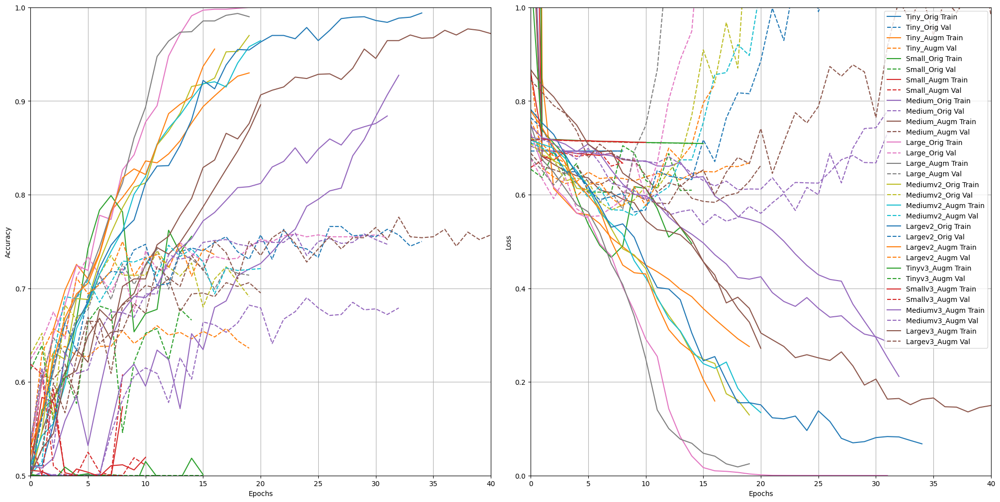

In [307]:
plotter1 = tfdocs.plots.HistoryPlotter(metric = 'accuracy')
plotter2 = tfdocs.plots.HistoryPlotter(metric = 'loss')

fig3 = plt.figure(figsize=(20, 10), layout="constrained")
spec3 = fig3.add_gridspec(ncols=2, nrows=1)

ax5 = fig3.add_subplot(spec3[0, 0])
plotter1.plot(size_histories)
ax5.get_legend().remove()
plt.ylim([0.5, 1])

ax6 = fig3.add_subplot(spec3[0, 1])
plotter2.plot(size_histories)
plt.ylim([0, 1])

In [308]:
size_histories['LargeV4_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV4', 'sizes/LargeV4_Augm')
size_histories['LargeV5_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV5', 'sizes/LargeV5_Augm')
size_histories['LargeV6_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV6', 'sizes/LargeV6_Augm')
size_histories['LargeV7_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV7', 'sizes/LargeV7_Augm')
size_histories['LargeV8_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV8', 'sizes/LargeV8_Augm')

Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_155 (Conv2D)             │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_153               │ (None, 74, 74, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_156 (Conv2D)             │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_154               │ (None, 36, 36, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_157 (Conv2D)             │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_155               │ (None, 17, 17, 256)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_158 (Conv2D)             │ (None, 15, 15, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_156               │ (None, 7, 7, 512)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_63 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_57 (Dropout)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_58 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_59 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_60 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,631,681 (32.93 MB)

 Trainable params: 8,631,681 (32.93 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 82s 5s/step - accuracy: 0.5045 - loss: 0.9108 - val_accuracy: 0.5000 - val_loss: 0.8649
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 79s 5s/step - accuracy: 0.5044 - loss: 0.8562 - val_accuracy: 0.5000 - val_loss: 0.8363
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.4855 - loss: 0.8324 - val_accuracy: 0.5030 - val_loss: 0.8150
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 79s 5s/step - accuracy: 0.5382 - loss: 0.8122 - val_accuracy: 0.5000 - val_loss: 0.8039
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 78s 5s/step - accuracy: 0.5081 - loss: 0.8001 - val_accuracy: 0.5000 - val_loss: 0.7907
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.5054 - loss: 0.7879 - val_accuracy: 0.5000 - val_loss: 0.7808
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.5007 - loss: 0.7788 - val_accuracy: 0.5000 - val_loss: 0.7726
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 78s 5s/step - accuracy: 0.5020 - loss: 0.7706 - val_accuracy: 0.5000 - val_loss:

Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_159 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_157               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_160 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_158               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_161 (Conv2D)             │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_159               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_162 (Conv2D)             │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_160               │ (None, 7, 7, 256)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_64 (Flatten)            │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_61 (Dropout)            │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1024)           │    12,846,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_62 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_63 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_64 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,334,721 (58.50 MB)

 Trainable params: 15,334,721 (58.50 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.4951 - loss: 1.1106 - val_accuracy: 0.5000 - val_loss: 1.0215
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.5128 - loss: 1.0024 - val_accuracy: 0.6230 - val_loss: 0.9526
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.5269 - loss: 0.9375 - val_accuracy: 0.6000 - val_loss: 0.8775
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.6060 - loss: 0.8752 - val_accuracy: 0.5580 - val_loss: 0.8386
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.5958 - loss: 0.8541 - val_accuracy: 0.6110 - val_loss: 0.8036
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.6546 - loss: 0.7858 - val_accuracy: 0.6390 - val_loss: 0.7645
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.6762 - loss: 0.7432 - val_accuracy: 0.6890 - val_loss: 0.7109
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.6894 - loss: 0.7145 - val_accuracy: 0.6970 - val_loss:

Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_163 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_161               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_164 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_162               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_165 (Conv2D)             │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_163               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_166 (Conv2D)             │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_164               │ (None, 7, 7, 256)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_167 (Conv2D)             │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_165               │ (None, 2, 2, 512)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_65 (Flatten)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_65 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_66 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_67 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_68 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_69 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_175 (Dense)               │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,816,577 (26.00 MB)

 Trainable params: 6,816,577 (26.00 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.5134 - loss: 1.1987 - val_accuracy: 0.5000 - val_loss: 1.1389
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.4920 - loss: 1.1246 - val_accuracy: 0.5300 - val_loss: 1.0810
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.5080 - loss: 1.0690 - val_accuracy: 0.5000 - val_loss: 1.0365
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.5387 - loss: 1.0246 - val_accuracy: 0.5000 - val_loss: 1.0006
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.5004 - loss: 0.9946 - val_accuracy: 0.5000 - val_loss: 0.9698
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.4994 - loss: 0.9625 - val_accuracy: 0.5000 - val_loss: 0.9413
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.4730 - loss: 0.9369 - val_accuracy: 0.5000 - val_loss: 0.9168
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.4976 - loss: 0.9117 - val_accuracy: 0.5000 - val_loss:

Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_168 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_169 (Conv2D)             │ (None, 146, 146, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_166               │ (None, 73, 73, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_170 (Conv2D)             │ (None, 71, 71, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_171 (Conv2D)             │ (None, 69, 69, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_167               │ (None, 34, 34, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_172 (Conv2D)             │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_173 (Conv2D)             │ (None, 30, 30, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_168               │ (None, 15, 15, 256)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_174 (Conv2D)             │ (None, 13, 13, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_175 (Conv2D)             │ (None, 11, 11, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_169               │ (None, 5, 5, 512)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_176 (Conv2D)             │ (None, 3, 3, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_177 (Conv2D)             │ (None, 1, 1, 1024)     │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_170               │ (None, 0, 0, 1024)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_66 (Flatten)            │ (None, 0)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_70 (Dropout)            │ (None, 0)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 1024)           │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_71 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_72 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 12,573,441 (47.96 MB)

 Trainable params: 12,573,441 (47.96 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


ValueError: Exception encountered when calling MaxPooling2D.call().

[1mNegative dimension size caused by subtracting 2 from 1 for '{{node sequential_70_1/max_pooling2d_170_1/MaxPool2d}} = MaxPool[T=DT_FLOAT, data_format="NHWC", explicit_paddings=[], ksize=[1, 2, 2, 1], padding="VALID", strides=[1, 2, 2, 1]](sequential_70_1/conv2d_177_1/Relu)' with input shapes: [?,1,1,1024].[0m

Arguments received by MaxPooling2D.call():
  • inputs=tf.Tensor(shape=(None, 1, 1, 1024), dtype=float32)

(0.0, 1.0)

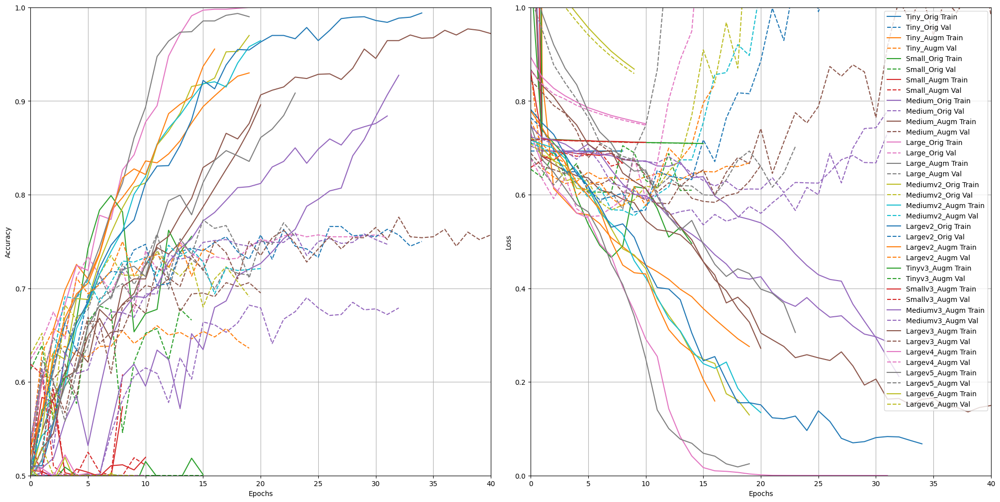

In [309]:
plotter1 = tfdocs.plots.HistoryPlotter(metric = 'accuracy')
plotter2 = tfdocs.plots.HistoryPlotter(metric = 'loss')

fig4 = plt.figure(figsize=(20, 10), layout="constrained")
spec4 = fig4.add_gridspec(ncols=2, nrows=1)

ax7 = fig4.add_subplot(spec4[0, 0])
plotter1.plot(size_histories)
ax7.get_legend().remove()
plt.ylim([0.5, 1])

ax8 = fig4.add_subplot(spec4[0, 1])
plotter2.plot(size_histories)
plt.ylim([0, 1])

In [312]:
size_histories['LargeV7_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV7', 'sizes/LargeV7_Augm')
size_histories['LargeV8_Augm'] = compile_and_fit(train_augm_data_gen, 'largeV8', 'sizes/LargeV8_Augm')

Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_188 (Conv2D)             │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_176               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_189 (Conv2D)             │ (None, 73, 73, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_177               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_190 (Conv2D)             │ (None, 35, 35, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_178               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_191 (Conv2D)             │ (None, 16, 16, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_179               │ (None, 8, 8, 256)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_192 (Conv2D)             │ (None, 7, 7, 512)      │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_180               │ (None, 3, 3, 512)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_68 (Flatten)            │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_80 (Dropout)            │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 1024)           │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_81 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_82 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_83 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_189 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_84 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,567,137 (32.68 MB)

 Trainable params: 8,567,137 (32.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.5087 - loss: 1.2048 - val_accuracy: 0.5000 - val_loss: 1.1024
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.4997 - loss: 1.0777 - val_accuracy: 0.5450 - val_loss: 1.0051
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.5546 - loss: 0.9836 - val_accuracy: 0.6300 - val_loss: 0.9164
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.6051 - loss: 0.9125 - val_accuracy: 0.6080 - val_loss: 0.8698
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.6111 - loss: 0.8617 - val_accuracy: 0.5940 - val_loss: 0.8477
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.6548 - loss: 0.8053 - val_accuracy: 0.6930 - val_loss: 0.7621
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.6935 - loss: 0.7467 - val_accuracy: 0.6560 - val_loss: 0.7383
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.6974 - loss: 0.7246 - val_accuracy: 0.6800 - val_loss:

Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_193 (Conv2D)             │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_194 (Conv2D)             │ (None, 148, 148, 64)   │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_181               │ (None, 74, 74, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_195 (Conv2D)             │ (None, 73, 73, 64)     │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_196 (Conv2D)             │ (None, 72, 72, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_182               │ (None, 36, 36, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_197 (Conv2D)             │ (None, 35, 35, 128)    │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_198 (Conv2D)             │ (None, 34, 34, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_183               │ (None, 17, 17, 256)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_199 (Conv2D)             │ (None, 16, 16, 256)    │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_200 (Conv2D)             │ (None, 15, 15, 512)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_184               │ (None, 7, 7, 512)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_201 (Conv2D)             │ (None, 6, 6, 512)      │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_202 (Conv2D)             │ (None, 5, 5, 1024)     │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_185               │ (None, 2, 2, 1024)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_69 (Flatten)            │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_85 (Dropout)            │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 1024)           │     4,195,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_86 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_87 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 11,534,625 (44.00 MB)

 Trainable params: 11,534,625 (44.00 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 107s 7s/step - accuracy: 0.5134 - loss: 1.3324 - val_accuracy: 0.5000 - val_loss: 1.1650
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 141s 6s/step - accuracy: 0.4921 - loss: 1.1264 - val_accuracy: 0.5000 - val_loss: 1.0275
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 101s 6s/step - accuracy: 0.4977 - loss: 1.0066 - val_accuracy: 0.5000 - val_loss: 0.9523
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 100s 6s/step - accuracy: 0.4874 - loss: 0.9407 - val_accuracy: 0.5000 - val_loss: 0.9044
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 142s 6s/step - accuracy: 0.4948 - loss: 0.8955 - val_accuracy: 0.5000 - val_loss: 0.8692
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 100s 6s/step - accuracy: 0.4681 - loss: 0.8628 - val_accuracy: 0.5000 - val_loss: 0.8423
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 101s 6s/step - accuracy: 0.5206 - loss: 0.8363 - val_accuracy: 0.5000 - val_loss: 0.8208
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 101s 6s/step - accuracy: 0.4868 - loss: 0.8170 - val_accuracy: 0.5000 - v

(0.4, 1.0)

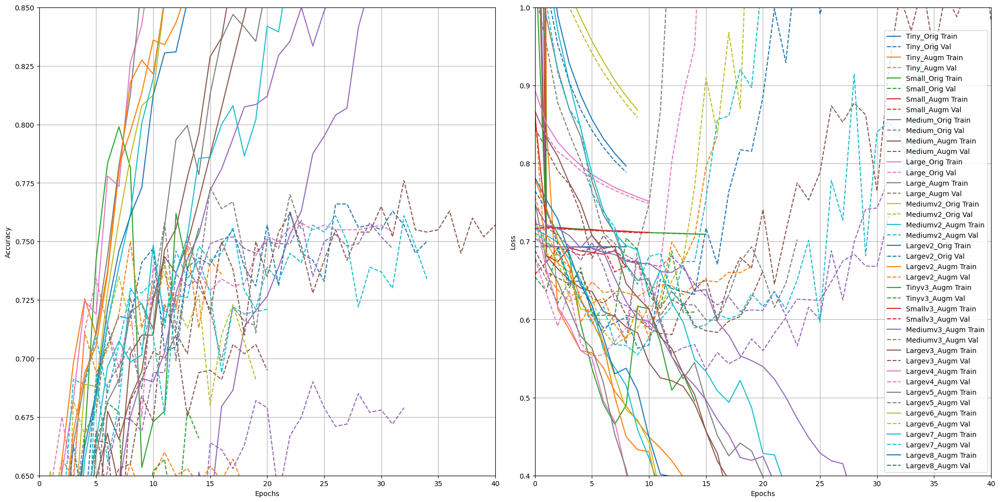

In [314]:
plotter1 = tfdocs.plots.HistoryPlotter(metric = 'accuracy')
plotter2 = tfdocs.plots.HistoryPlotter(metric = 'loss')

fig4 = plt.figure(figsize=(20, 10), layout="constrained")
spec4 = fig4.add_gridspec(ncols=2, nrows=1)

ax7 = fig4.add_subplot(spec4[0, 0])
plotter1.plot(size_histories)
ax7.get_legend().remove()
plt.ylim([0.65, 0.85])

ax8 = fig4.add_subplot(spec4[0, 1])
plotter2.plot(size_histories)
plt.ylim([0.4, 1])

### Cell 4
The plotImages function will be used a few times to plot images. It takes an array of images and a probabilities list, although the probabilities list is optional. This code is given to you. If you created the train_data_gen variable correctly, then running this cell will plot five random training images.

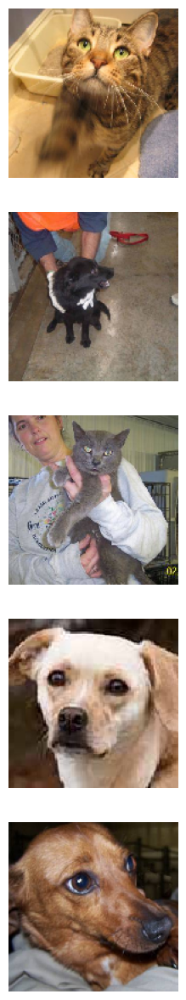

In [12]:
# 4
def plotImages(images_arr, probabilities = False):
    fig, axes = plt.subplots(len(images_arr), 1, figsize=(5,len(images_arr) * 3))
    if probabilities is False:
      for img, ax in zip( images_arr, axes):
          ax.imshow(img)
          ax.axis('off')
    else:
      for img, probability, ax in zip( images_arr, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')
          if probability > 0.5:
              ax.set_title("%.2f" % (probability*100) + "% dog")
          else:
              ax.set_title("%.2f" % ((1-probability)*100) + "% cat")
    plt.show()

sample_training_images, _ = next(train_data_gen)
plotImages(sample_training_images[:5])


In [361]:
data_gen = train_data_gen
len(data_gen), len(data_gen[0]), len(data_gen[0][0]), len(data_gen[0][0][0]), len(data_gen[0][0][0][0]), len(data_gen[0][0][0][0][0])

(16, 2, 128, 150, 150, 3)

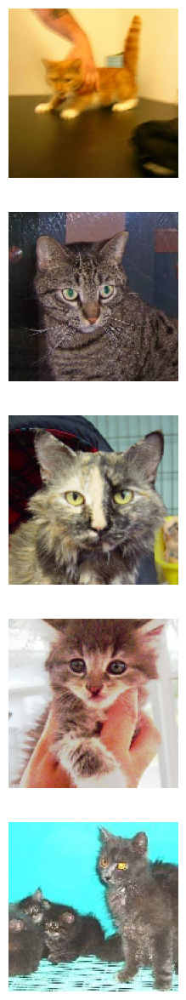

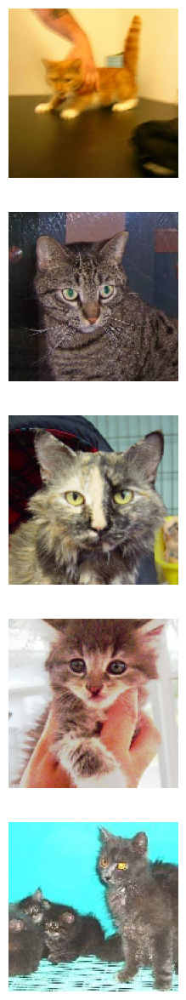

In [392]:
#sample_training_images, _ = next(train_augm_data_gen)
plotImages(train_data_gen[0][0][:5])
plotImages(train_augm_data_gen[0][0][:5])

### Cell 5
Recreate the train_image_generator using ImageDataGenerator.

Since there are a small number of training examples, there is a risk of overfitting. One way to fix this problem is by creating more training data from existing training examples by using random transformations.

Add 4-6 random transformations as arguments to ImageDataGenerator. Make sure to rescale the same as before.

In [ ]:
# 5
train_image_generator = ImageDataGenerator(
    rotation_range=60,
    zoom_range=0.5,
    horizontal_flip=True,
    brightness_range=[0.5,2],
    rescale = 1./255,
)


### Cell 6
You don't have to do anything for this cell. train_data_gen is created just like before but with the new train_image_generator. Then, a single image is plotted five different times using different variations.

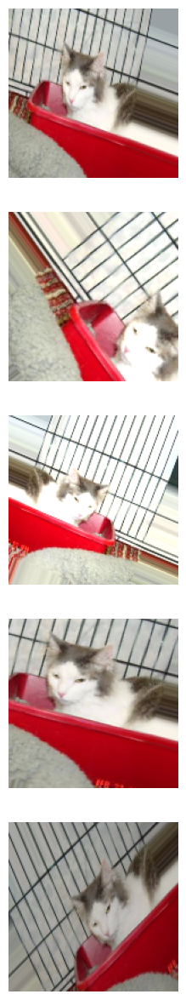

In [ ]:
# 6
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     keep_aspect_ratio=True,
                                                     class_mode='binary')

augmented_images = [train_augm_data_gen[0][0][0] for i in range(5)]

plotImages(augmented_images)

### Cell 7
In this cell, create a model for the neural network that outputs class probabilities. It should use the Keras Sequential model. It will probably involve a stack of Conv2D and MaxPooling2D layers and then a fully connected layer on top that is activated by a ReLU activation function.

Compile the model passing the arguments to set the optimizer and loss. Also pass in metrics=['accuracy'] to view training and validation accuracy for each training epoch.

In [20]:
# 7
model = Sequential([ #67% acc
    Conv2D(32, (3, 3), input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    
    Flatten(),
    Dense(256, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_13 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 34, 34, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │     4,735,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,791,809 (18.28 MB)

 Trainable params: 4,791,809 (18.28 MB)

 Non-trainable params: 0 (0.00 B)

### Cell 8
Use the fit method on your model to train the network. Make sure to pass in arguments for x, steps_per_epoch, epochs, validation_data, and validation_steps.

In [21]:
# 8
history = model.fit(
    train_data_gen,
    #steps_per_epoch=total_train // batch_size,
    epochs=epochs,
    validation_data=val_data_gen,
    #validation_steps=total_val // batch_size
)

/home/andreati/Coding/Learning/TensorFlow/.venvTF/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.5093 - loss: 1.7415 - val_accuracy: 0.5320 - val_loss: 0.6896
Epoch 2/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.5310 - loss: 0.6931 - val_accuracy: 0.5160 - val_loss: 0.6850
Epoch 3/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.5487 - loss: 0.6842 - val_accuracy: 0.5340 - val_loss: 0.6812
Epoch 4/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.5387 - loss: 0.6859 - val_accuracy: 0.5840 - val_loss: 0.6653
Epoch 5/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5693 - loss: 0.6790 - val_accuracy: 0.5610 - val_loss: 0.6660
Epoch 6/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.5792 - loss: 0.6726 - val_accuracy: 0.5850 - val_loss: 0.6556
Epoch 7/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.5799 - loss: 0.6757 - val_accuracy: 0.6170 - val_loss: 0.6517
Epoch 8/15
16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5631 - loss: 0.6721 - val_accuracy: 0.6280 - val_loss:

### Cell 9
Run this cell to visualize the accuracy and loss of the model.

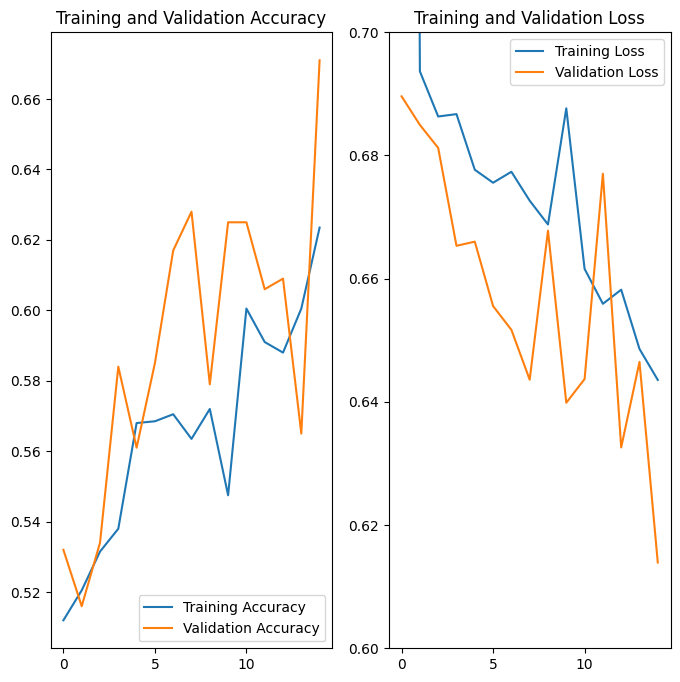

In [22]:
# 9
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.ylim([0.6, 0.7])
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Cell 10
Now it is time to use your model to predict whether a brand new image is a cat or a dog.

In this cell, get the probability that each test image (from test_data_gen) is a dog or a cat. probabilities should be a list of integers.

Call the plotImages function and pass in the test images and the probabilities corresponding to each test image.

After you run the cell, you should see all 50 test images with a label showing the percentage of "sure" that the image is a cat or a dog. The accuracy will correspond to the accuracy shown in the graph above (after running the previous cell). More training images could lead to a higher accuracy.

In [23]:
# 10
probabilities = model.predict(test_data_gen).flatten()
probabilities

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


array([0.43251416, 0.28814706, 0.42057732, 0.66107196, 0.4664057 ,
       0.44310153, 0.498552  , 0.38247448, 0.51269454, 0.7860207 ,
       0.4644762 , 0.51390314, 0.41390178, 0.34979603, 0.47828525,
       0.5104668 , 0.46882737, 0.578007  , 0.45185664, 0.4606675 ,
       0.43166563, 0.5432593 , 0.310421  , 0.56651527, 0.54820466,
       0.50494695, 0.65113145, 0.40056595, 0.4561766 , 0.3740885 ,
       0.5899336 , 0.47165722, 0.52448624, 0.99953634, 0.3707107 ,
       0.4210537 , 0.98039544, 0.47027016, 0.44679198, 0.44124034,
       0.42165786, 0.39083442, 0.6152027 , 0.4665853 , 0.5221319 ,
       0.42163613, 0.3812494 , 0.40877703, 0.38099298, 0.5112671 ],
      dtype=float32)

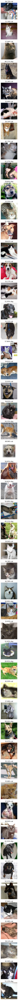

In [24]:
test_images, _ = next(test_data_gen)
plotImages(test_images, probabilities)

In [25]:
# 11
answers =  [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
            1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
            1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
            1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
            0, 0, 0, 0, 0, 0]

correct = 0

for probability, answer in zip(probabilities, answers):
  if round(probability) == answer:
    correct +=1

percentage_identified = (correct / len(answers)) * 100

passed_challenge = percentage_identified >= 63

print(f"Your model correctly identified {round(percentage_identified, 2)}% of the images of cats and dogs.")

if passed_challenge:
  print("You passed the challenge!")
else:
  print("You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!")

Your model correctly identified 68.0% of the images of cats and dogs.
You passed the challenge!
